In [1]:
from IPython.core.display import HTML

# Apply styles globally within the notebook
HTML('''
<style>
  h2 {
    font-size: var(--j3p-content-font-size4);
    background-color:lime;
    color: red;
    display: flex;
    align-items: center;
    justify-content: center;
    padding: 10px 41px;
    top: 10px;
    position: relative;
    border-radius: 10px 50px 10px 50px;
}

 img {       /* flex-grow: 1; */
            /* flex-shrink: 1; */
            border-radius: 100px 70px 150px 70px; 
            border: 10px solid #eee;
            display: flex;
            align-items: center;
            justify-content: center;
            transition: box-shadow 0.3s ease; /* Add a transition for a smooth effect */
        }

       img:active {
          box-shadow: 0 10px 20px rgba(173, 216, 230, 1) 0 6px 6px rgba(0, 0, 255, 1.0
173, 216, 230, 1);
        }
video {
    width: 820px; /* Set the width of the video */
    height: auto; /* Adjust the height automatically */
    border-radius: 25px; /* Add a border radius for rounded corners */
    border: 5px solid #eee; /* Add a border */
    box-shadow: 0 10px 20px rgba(173, 216, 230, 1), 0 6px 6px rgba((0, 0, 255, 1.0)); /* Add a box shadow */
    display: flex;
    controls: autoplay;
    align-items: center;
    justify-content: center;
    transition: box-shadow 0.3s ease; /* Add a transition for a smooth effect */
  }

  video:active {
    box-shadow: 0 10px 20px rgba(173, 216, 230, 1), 0 6px 6px rgba();
  }


</style>
''')  

## Maintance Prediction 

<img src="https://img.freepik.com/free-vector/maintenance-background-design_1294-45.jpg?semt=ais_hybrid" alt="My Image">

## Table of Contents 

<div style="border: 2px solid red; padding: 10px; background-color: #F5F5F5; color: black; border-radius: 30px 45px 30px 45px;">

   
    
    
<p> &bull;        <a target="_blank"> Introudction</a>  </p> 

<p> &bull;      <a target="_blank"> Explanory Data Analysis</a>  </p>

<p>&bull;       <a target="_blank"> Data Processing</a>  </p>

<p>&bull;       <a target="_blank"> Model Bulding</a> </p>   
    
<p>&bull;       <a target="_blank"> Evalution Metrics </a> </p> 

<p>&bull;       <a target="_blank"> Results & see the best models </a> </p>   

</div>

## Data Information

<div style="border: 2px solid red; padding: 10px; background-color: #F5F5F5; color: black; border-radius: 30px 45px 30px 45px;">


<p>&bull; Machine Predictive Maintenance Classification Dataset <p>

<p>&bull; Since real predictive maintenance datasets are generally difficult to obtain and in particular difficult to publish, we present and provide a synthetic dataset that reflects real predictive maintenance encountered in the industry to the best of our knowledge.</p>

<p>&bull;Additional Information :

The dataset consists of 10 000 data points stored as rows with 14 features in columns.</p>

<p>&bull;Important : There are two Targets - Do not make the mistake of using one of them as feature, as it will lead to leakage.</p>

<p>&bull; Target : Failure or Not</p>

<p>&bull; Failure Type : Type of Failure</p>

<p>&bull; <a href="https://archive.ics.uci.edu/ml/datasets/AI4I+2020+Predictive+Maintenance+Dataset" target="_blank">Data Source UCI :</a></p>


</div>

![](https://j.gifs.com/76kDrQ.gif)

## Understand the problem :








<div style="border: 2px solid red; padding: 10px; background-color: #F5F5F5; color: black; border-radius: 30px 45px 30px 45px;">

<p> &bull; This problem Consider as binary Classification problrm   .</p> 

<p> &bull; Target of this problem to predict on  Target Column and classify if Failure or Not   .</p> 


<p> &bull; I will Train 5 models for Machine learning with visualization of them. (SportVectorMachine,RandomForestClassifier,Decision Tree Classifier,gradient boosting classifier,LogisticRegression .</p> 

<p>&bull; Also i will Make Explanory Analysis for the Data By using both SQL & Pandas  </p>

<p>&bull; Also i will learn the Relations between the Feature to  Make Different Plots that Represent the Data  </p>   
    
</div>

| Data fields      | Description                                                                                                 |
| ------------- | ----------------------------------------------------------------------------------------------------------- |
| UID:           | unique identifier ranging from 1 to 10000                                                                                     |
| productID:          |  consisting of a letter L, M, or H for low (50% of all products), medium (30%), and high (20%) as product quality variants and a variant-specific serial number                                                                                       |
| air temperature [K]: | generated using a random walk process later normalized to a standard deviation of 2 K around 300 K                                                                             |
| Temperature          |  Temperature in Celsius                                                                                           |
| process temperature [K]: | generated using a random walk process normalized to a standard deviation of 1 K, added to the air temperature plus 10 K.                                                                                |
| rotational speed [rpm]:        |  calculated from powepower of 2860 W, overlaid with a normally distributed noise                                                                            |
| torque [Nm]:       |  torque values are normally distributed around 40 Nm with an Ïƒ = 10 Nm and no negative values.                                                                                 |
| tool wear [min]: |The quality variants H/M/L add 5/3/2 minutes of tool wear to the used tool in the proces .|
| machine failure: |abel that indicates, whether the machine has failed in this particular data point for any of the following failure modes are true. .                  
                  
                  
                  
                                                                          

## imports 

In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import graphviz
from sklearn.preprocessing import StandardScaler,OneHotEncoder,LabelEncoder,MinMaxScaler
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.ensemble import RandomForestClassifier,GradientBoostingClassifier
from sklearn.datasets import make_classification
from sklearn import svm
from sklearn.tree import DecisionTreeClassifier
from sklearn import metrics
from sklearn.metrics import classification_report,confusion_matrix ,ConfusionMatrixDisplay,accuracy_score,precision_score,recall_score,f1_score
from sklearn.metrics import mean_squared_error
from sklearn import tree
from sklearn.linear_model import LogisticRegression
from sklearn.impute import SimpleImputer
import sqlite3
from plotly.graph_objs import *
import plotly.express as px 
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from sklearn.pipeline import Pipeline
import warnings

# Suppress all warnings
warnings.filterwarnings('ignore')



In [3]:
# load the data:

data=pd.read_csv("predictive_maintenance.csv")
data.head(25)

,UDI,Product ID,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Target,Failure Type
0,1,M14860,M,298.1,308.6,1551,42.8,0,0,No Failure
1,2,L47181,L,298.2,308.7,1408,46.3,3,0,No Failure
2,3,L47182,L,298.1,308.5,1498,49.4,5,0,No Failure
3,4,L47183,L,298.2,308.6,1433,39.5,7,0,No Failure
4,5,L47184,L,298.2,308.7,1408,40.0,9,0,No Failure
5,6,M14865,M,298.1,308.6,1425,41.9,11,0,No Failure
6,7,L47186,L,298.1,308.6,1558,42.4,14,0,No Failure
7,8,L47187,L,298.1,308.6,1527,40.2,16,0,No Failure
8,9,M14868,M,298.3,308.7,1667,28.6,18,0,No Failure
9,10,M14869,M,298.5,309.0,1741,28.0,21,0,No Failure


## Explore the Data :

In [4]:
#Default theme

plt.style.use('dark_background')
warnings.filterwarnings("ignore", category=UserWarning, message="findfont: Font family")


In [5]:
#get info about the dataset:
print(data.info())
print("-"*25)
# to know more about the shape of the dataset:
print("shape of the dataset -->>",np.shape(data))
print("Size of the dataset -->>",data.size,"Record")

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 10 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   UDI                      10000 non-null  int64  
 1   Product ID               10000 non-null  object 
 2   Type                     10000 non-null  object 
 3   Air temperature [K]      10000 non-null  float64
 4   Process temperature [K]  10000 non-null  float64
 5   Rotational speed [rpm]   10000 non-null  int64  
 6   Torque [Nm]              10000 non-null  float64
 7   Tool wear [min]          10000 non-null  int64  
 8   Target                   10000 non-null  int64  
 9   Failure Type             10000 non-null  object 
dtypes: float64(3), int64(4), object(3)
memory usage: 781.4+ KB
None
-------------------------
shape of the dataset -->> (10000, 10)
Size of the dataset -->> 100000 Record


In [6]:
#get the statistical:

data.describe().T.style.background_gradient(cmap="Dark2")

,count,mean,std,min,25%,50%,75%,max
UDI,10000.000000,5000.500000,2886.895680,1.000000,2500.750000,5000.500000,7500.250000,10000.000000
Air temperature [K],10000.000000,300.004930,2.000259,295.300000,298.300000,300.100000,301.500000,304.500000
Process temperature [K],10000.000000,310.005560,1.483734,305.700000,308.800000,310.100000,311.100000,313.800000
Rotational speed [rpm],10000.000000,1538.776100,179.284096,1168.000000,1423.000000,1503.000000,1612.000000,2886.000000
Torque [Nm],10000.000000,39.986910,9.968934,3.800000,33.200000,40.100000,46.800000,76.600000
Tool wear [min],10000.000000,107.951000,63.654147,0.000000,53.000000,108.000000,162.000000,253.000000
Target,10000.000000,0.033900,0.180981,0.000000,0.000000,0.000000,0.000000,1.000000


In [7]:
# get Types of features:

data.dtypes

UDI                          int64
Product ID                  object
Type                        object
Air temperature [K]        float64
Process temperature [K]    float64
Rotational speed [rpm]       int64
Torque [Nm]                float64
Tool wear [min]              int64
Target                       int64
Failure Type                object
dtype: object

In [8]:
# know the number of every item in every column:

for col in data.columns:
    print(f"counts of items in {col} -->> \n {data[col].value_counts()}")
    print("-"*25)

counts of items in UDI -->> 
 UDI
1        1
6671     1
6664     1
6665     1
6666     1
        ..
3334     1
3335     1
3336     1
3337     1
10000    1
Name: count, Length: 10000, dtype: int64
-------------------------
counts of items in Product ID -->> 
 Product ID
M14860    1
L53850    1
L53843    1
L53844    1
L53845    1
         ..
M18193    1
M18194    1
L50515    1
L50516    1
M24859    1
Name: count, Length: 10000, dtype: int64
-------------------------
counts of items in Type -->> 
 Type
L    6000
M    2997
H    1003
Name: count, dtype: int64
-------------------------
counts of items in Air temperature [K] -->> 
 Air temperature [K]
300.7    279
298.9    231
297.4    230
300.5    229
298.8    227
        ... 
304.4      7
296.0      6
295.4      3
295.3      3
304.5      1
Name: count, Length: 93, dtype: int64
-------------------------
counts of items in Process temperature [K] -->> 
 Process temperature [K]
310.6    317
310.8    273
310.7    266
308.6    265
310.5    263
 

In [9]:
# to know the uniques values in evey column in the dataset:
for col in data.columns:
    print(f"All items in the ---->>>{col} column  : \n{data[col].unique()}")
    print("*"*50)

All items in the ---->>>UDI column  : 
[    1     2     3 ...  9998  9999 10000]
**************************************************
All items in the ---->>>Product ID column  : 
['M14860' 'L47181' 'L47182' ... 'M24857' 'H39412' 'M24859']
**************************************************
All items in the ---->>>Type column  : 
['M' 'L' 'H']
**************************************************
All items in the ---->>>Air temperature [K] column  : 
[298.1 298.2 298.3 298.5 298.4 298.6 298.7 298.8 298.9 299.  299.1 298.
 297.9 297.8 297.7 297.6 297.5 297.4 297.3 297.2 297.1 297.  296.9 296.8
 296.7 296.6 296.5 296.3 296.4 296.2 296.1 296.  295.9 295.8 295.7 295.6
 295.5 295.4 295.3 299.2 299.3 299.5 299.4 299.6 299.7 299.8 299.9 300.
 300.1 300.2 300.3 300.4 300.5 300.6 300.7 300.8 300.9 301.  301.1 301.2
 301.3 301.4 301.5 301.6 301.7 301.8 301.9 302.  302.1 302.2 302.3 302.4
 302.5 302.6 302.7 302.8 302.9 303.  303.1 303.2 303.3 303.4 303.5 303.6
 303.7 303.8 303.9 304.  304.1 304.2 304.3

In [10]:
# Extract all Types of columns from the data :
for col in data.columns:
    obj_cols=data.select_dtypes("object").columns

    num_cols=data.select_dtypes("number").columns

    disc_cols=data.select_dtypes(include=("int64")).columns

    conts_cols=data.select_dtypes(include=("float64")).columns

    Nomial_cols=data.nunique()[data.nunique()<3]

print(f"object_columns ----->>> {obj_cols}\n Numerical_columns ----->>> {num_cols} \n Discrete_columns ---->>> {disc_cols} \n Continous_cols ----->> {conts_cols} \n Nominal Columns --->> {Nomial_cols}")

object_columns ----->>> Index(['Product ID', 'Type', 'Failure Type'], dtype='object')
 Numerical_columns ----->>> Index(['UDI', 'Air temperature [K]', 'Process temperature [K]',
       'Rotational speed [rpm]', 'Torque [Nm]', 'Tool wear [min]', 'Target'],
      dtype='object') 
 Discrete_columns ---->>> Index(['UDI', 'Rotational speed [rpm]', 'Tool wear [min]', 'Target'], dtype='object') 
 Continous_cols ----->> Index(['Air temperature [K]', 'Process temperature [K]', 'Torque [Nm]'], dtype='object') 
 Nominal Columns --->> Target    2
dtype: int64


## Cleaning :







<div style="border: 3px solid yellow; padding: 10px; background-color: #F5F5F5; color: black; border-radius: 30px 45px 30px 45px;">

<p> &bull; At First i checked if ound any Null Values . </p> 

<p> &bull; Also i Removed unless columns like UDI & product ID. </p>

<p> &bull; I checked Duplicates values & Remove it if ound . </p>

<p> &bull; I removed Structure null values like (units in the columns)  </p>

<p> &bull; I used the Simple Imputer Method to fill the Null Values if it was very big . </p> 

<p> &bull; I used median Strategy with Numerical Features  .</p> 

<p> &bull; I make Reshape , then i make squeeze on it  . </p>

<p> &bull; Any Column , Rate of missing values Reach above 75% ,Delete it  . </p>

</div>








In [11]:
# check the Null Values :
# ok there no Any Null values :

data.isna().mean()

UDI                        0.0
Product ID                 0.0
Type                       0.0
Air temperature [K]        0.0
Process temperature [K]    0.0
Rotational speed [rpm]     0.0
Torque [Nm]                0.0
Tool wear [min]            0.0
Target                     0.0
Failure Type               0.0
dtype: float64

In [12]:
# Drop any null values if found :
df = data.dropna()
df.isna().mean()

UDI                        0.0
Product ID                 0.0
Type                       0.0
Air temperature [K]        0.0
Process temperature [K]    0.0
Rotational speed [rpm]     0.0
Torque [Nm]                0.0
Tool wear [min]            0.0
Target                     0.0
Failure Type               0.0
dtype: float64

In [13]:
# Drop unless column like UDI & Product ID :

df = data.drop(columns=["UDI", "Product ID"], axis=1)
df.columns

Index(['Type', 'Air temperature [K]', 'Process temperature [K]',
       'Rotational speed [rpm]', 'Torque [Nm]', 'Tool wear [min]', 'Target',
       'Failure Type'],
      dtype='object')

In [14]:
# Check if there are aduplicated values in the data & drop it if found :
duplicated_features=df.duplicated().sum()
print("Number of duplicates ----->>> ",duplicated_features)
df = df.drop_duplicates()
duplicated_features=df.duplicated().sum()
print("Number of duplicates of cleaning it ----->>> ",duplicated_features)

Number of duplicates ----->>>  0
Number of duplicates of cleaning it ----->>>  0


## Feature Engeneering :







<div style="border: 3px solid yellow; padding: 10px; background-color: #F5F5F5; color: black; border-radius: 30px 45px 30px 45px;">

<p> &bull; first :  Converting temperature in centigrate from Kelvin [1 K = -272.15 °C  ]    </p> 

<p> &bull;  Renaming temperature in Centigrate(°C) from Kelvin (K)  . </p>

<p> &bull; Create New Feature that called Temprature difference  Process temperature [°C] - Process temperature [°C]   . </p>

</div>








In [15]:

df["Air temperature [K]"] = df["Air temperature [K]"] - 272.15
df["Process temperature [K]"] = df["Process temperature [K]"] - 272.15

# Renaming temperature in Centigrate(°C) from Kelvin (K)

df.rename(columns={"Air temperature [K]" : "Air temperature [°C]","Process temperature [K]" : "Process temperature [°C]"},inplace=True)
print(df.columns)

Index(['Type', 'Air temperature [°C]', 'Process temperature [°C]',
       'Rotational speed [rpm]', 'Torque [Nm]', 'Tool wear [min]', 'Target',
       'Failure Type'],
      dtype='object')


In [16]:
# Remove units and other elements from column headers
df = df.rename(columns={
    'Air temperature [°C]': 'Air_temperature',
    'Process temperature [°C]': 'Process_temperature ',
    'Rotational speed [rpm]': 'Rotational_speed',
    'Torque [Nm]':'Torque',
    'Tool wear [min]':'Tool_wear',
    'Solar Radiation (MJ/m2)':'Solar_Radiation',
    'Failure Type': 'Failure_Type'
    })

df.head(10)

,Type,Air_temperature,Process_temperature,Rotational_speed,Torque,Tool_wear,Target,Failure_Type
0,M,25.95,36.45,1551,42.8,0,0,No Failure
1,L,26.05,36.55,1408,46.3,3,0,No Failure
2,L,25.95,36.35,1498,49.4,5,0,No Failure
3,L,26.05,36.45,1433,39.5,7,0,No Failure
4,L,26.05,36.55,1408,40.0,9,0,No Failure
5,M,25.95,36.45,1425,41.9,11,0,No Failure
6,L,25.95,36.45,1558,42.4,14,0,No Failure
7,L,25.95,36.45,1527,40.2,16,0,No Failure
8,M,26.15,36.55,1667,28.6,18,0,No Failure
9,M,26.35,36.85,1741,28.0,21,0,No Failure


## Explanory on Dataset: 




<div style="border: 5px solid yellow; padding: 10px; background-color: #F5F5F5; color: black; border-radius: 30px 45px 30px 45px;">

<p> &bull; Contex : </p> 

<p> &bull; Correlation : I make correlation to study Relations between features </p> 

<p> &bull; outliers : Defination outliers and check on each feature   .</p> 
<p> &bull; outliers : see percentage of every outliers at any column and how dealing with it    .</p> 

<p> &bull; heatmap : very strong plot that show the Strong / week Relations between features   .</p> 
</div>

In [17]:
# Calculate the correlation :

corr=df.select_dtypes("number").corr()
corr

,Air_temperature,Process_temperature,Rotational_speed,Torque,Tool_wear,Target
Air_temperature,1.000000,0.876107,0.022670,-0.013778,0.013853,0.082556
Process_temperature,0.876107,1.000000,0.019277,-0.014061,0.013488,0.035946
Rotational_speed,0.022670,0.019277,1.000000,-0.875027,0.000223,-0.044188
Torque,-0.013778,-0.014061,-0.875027,1.000000,-0.003093,0.191321
Tool_wear,0.013853,0.013488,0.000223,-0.003093,1.000000,0.105448
Target,0.082556,0.035946,-0.044188,0.191321,0.105448,1.000000


Text(0.5, 1.0, 'Correlation_heatmap_Matrix')

findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.


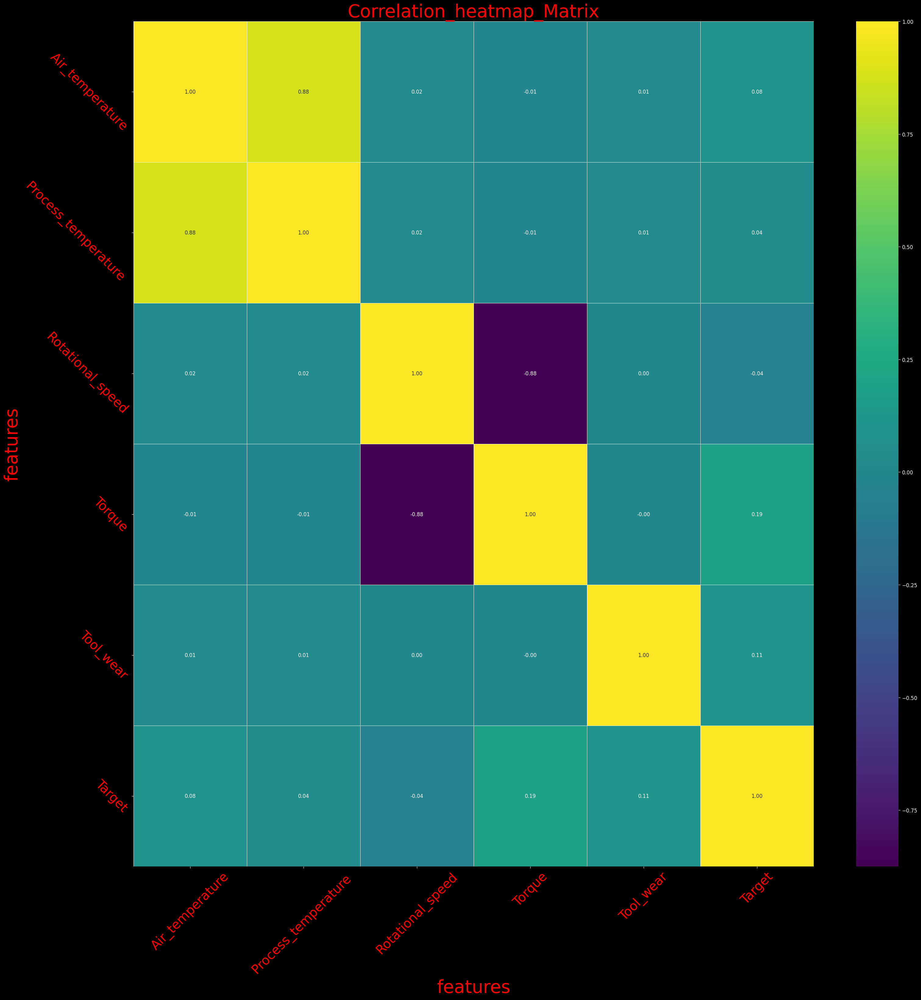

In [18]:
# plot the heatmap:
# plot the heatmap_Correlation_MatRix:

f1={"family":"Arial","size":35,"color":"r"}
plt.figure(figsize=(30,30),dpi=120)
sns.heatmap(df.select_dtypes("number").corr(),annot=True,fmt="0.2f",cmap='viridis',linewidths=0.5)
plt.xticks(rotation=45,color="r",fontsize=25)
plt.yticks(rotation=-45,color="r",fontsize=25)
plt.xlabel("features",fontdict=f1)
plt.ylabel("features",fontdict=f1)
plt.title("Correlation_heatmap_Matrix",fontdict=f1)

## Defination Outliers :

In [19]:
# found many feature contain the outliers  :
features=df.select_dtypes(include="number").columns

for col in features:
    Q1_col,Q3_col=df[col].quantile([0.25,0.75])
    iqr=Q3_col-Q1_col
    low_limit=Q1_col-1.5*iqr
    upper_limit=Q3_col+1.5*iqr
    outlier=[]
    for x in df[col]:
         if ((x> upper_limit) or (x<low_limit)):
             outlier.append(x)
    if len(outlier)==0:
        print(f" * -- >> there No outlier in {col} feature")
    else:
        print(f"Ther outlier in this feature {col}")

    print(f"Q1 of {col} --->>> {Q1_col} \n Q3 of {col} ---->>> {Q3_col} \n iqr--->>{iqr}\n low_limit--->>>{low_limit} \n  upper_limit--->>> {upper_limit} \n outlier---->>> {outlier} \n Number of outliers --->>> {len(outlier)} ")
    print("-"*90)
    

 * -- >> there No outlier in Air_temperature feature
Q1 of Air_temperature --->>> 26.150000000000034 
 Q3 of Air_temperature ---->>> 29.350000000000023 
 iqr--->>3.1999999999999886
 low_limit--->>>21.35000000000005 
  upper_limit--->>> 34.150000000000006 
 outlier---->>> [] 
 Number of outliers --->>> 0 
------------------------------------------------------------------------------------------
 * -- >> there No outlier in Process_temperature  feature
Q1 of Process_temperature  --->>> 36.650000000000034 
 Q3 of Process_temperature  ---->>> 38.950000000000045 
 iqr--->>2.3000000000000114
 low_limit--->>>33.20000000000002 
  upper_limit--->>> 42.40000000000006 
 outlier---->>> [] 
 Number of outliers --->>> 0 
------------------------------------------------------------------------------------------
Ther outlier in this feature Rotational_speed
Q1 of Rotational_speed --->>> 1423.0 
 Q3 of Rotational_speed ---->>> 1612.0 
 iqr--->>189.0
 low_limit--->>>1139.5 
  upper_limit--->>> 1895.5 
 

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


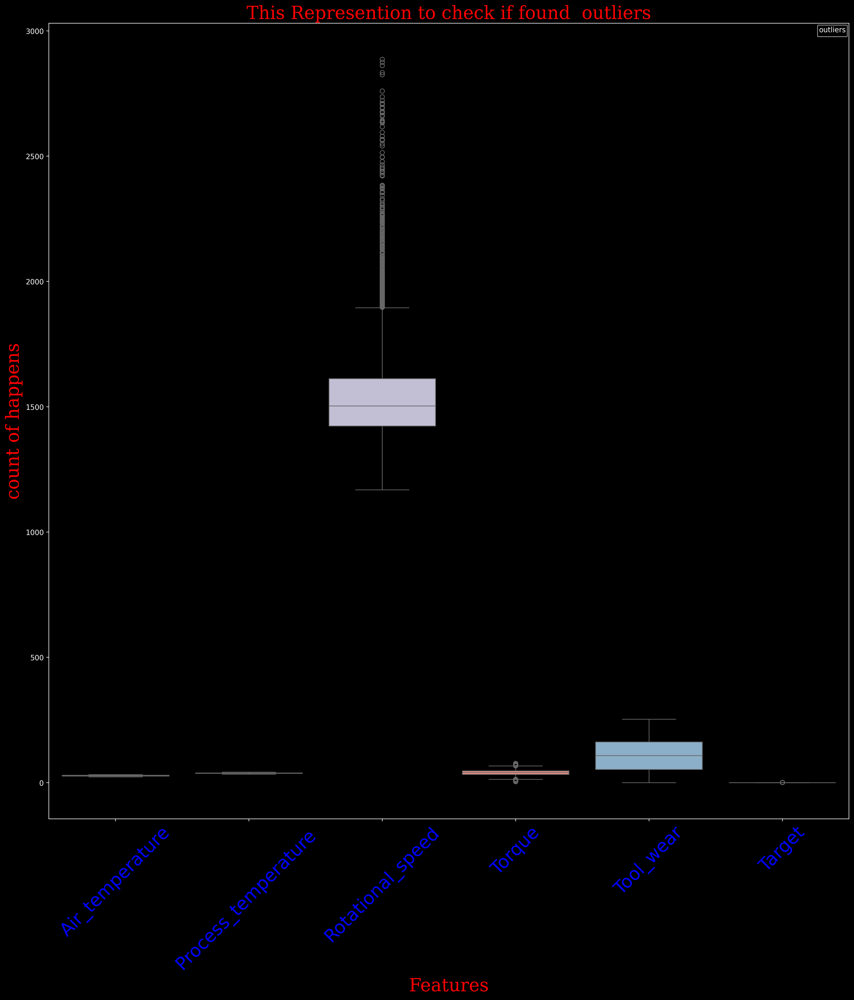

In [20]:
# from this Represention we discover that we found outliers :

f1={"family":"serif","size":25,"color":"r"}
plt.figure(figsize=(20,20),dpi=250)
plt.title("This Represention to check if found  outliers",fontdict=f1)
plt.xlabel("Features",fontdict=f1)
plt.ylabel("count of happens",fontdict=f1)
plt.xticks(rotation=45,color="b",fontsize=25)
sns.boxplot(df[features])
plt.legend(title="outliers",prop={'size': 5})

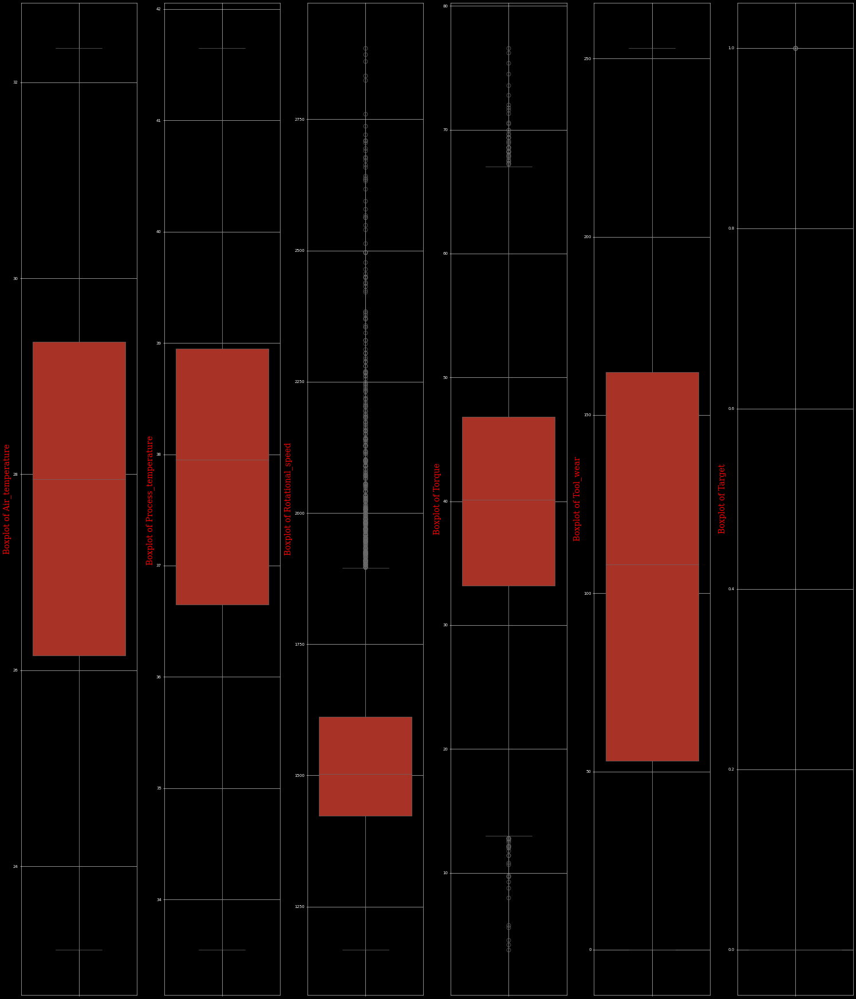

In [21]:
# Select numerical columns
F = df.select_dtypes(include="number").columns
num_columns = len(F)

# Set up the plot
plt.figure(figsize=(30, 35), dpi=50)
f2 = {"family": "serif", "size": 20, "color": "r"}

# Create side-by-side boxplots for each feature
for i, feature in enumerate(F):
    plt.subplot(1, num_columns, i + 1)
    sns.boxplot(
        df[feature].dropna(),
        patch_artist=True,
        boxprops=dict(facecolor='#a93226'),
        flierprops=dict(marker='o', color='b', markersize=10),
    )  # Change flierprops color to 'b'
    plt.ylabel(f'Boxplot of {feature}', fontdict=f2)
    plt.xticks(rotation=45, color="b")

    plt.grid(True)

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

In [22]:
# split the data int train & test :

x_class,y_class=make_classification()
x_class=df.drop("Target",axis=1)
y_class=df["Target"]

In [23]:
def remove_outliers_iqr(df):
    outlier_counts = {}
    outlier_means = {}
    
    
    for column in df.select_dtypes(include=[np.number]).columns:  
        Q1 = df[column].quantile(0.25)
        Q3 = df[column].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        
        # Identify outliers
        
        outliers = df[(df[column] < lower_bound) | (df[column] > upper_bound)]
        
        outlier_counts[column] = outliers.shape[0]
        
        # Calculate mean of outliers if any exist
        
        if not outliers.empty:
            outlier_means[column] = outliers[column].mean()
        else:
            outlier_means[column] = 0.0
        
        # Remove outliers from the DataFrame
        
        df_cleaned_without_target = df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]
    
    return df_cleaned_without_target, outlier_counts, outlier_means


df_cleaned_without_target, outlier_counts, outlier_means = remove_outliers_iqr(x_class)


# Display the results
print("Number of outliers detected in each column:")
print(outlier_counts)
print("-" * 70)
print("\nMean of outliers in each column:")
print(outlier_means)
print("-" * 70)
print("\nDataFrame after removing outliers:")
print(df_cleaned_without_target)

Number of outliers detected in each column:
{'Air_temperature': 0, 'Process_temperature ': 0, 'Rotational_speed': 418, 'Torque': 69, 'Tool_wear': 0}
----------------------------------------------------------------------

Mean of outliers in each column:
{'Air_temperature': 0.0, 'Process_temperature ': 0.0, 'Rotational_speed': 2102.0454545454545, 'Torque': 45.620289855072464, 'Tool_wear': 0.0}
----------------------------------------------------------------------

DataFrame after removing outliers:
     Type  Air_temperature  Process_temperature   Rotational_speed  Torque  \
0       M            25.95                 36.45              1551    42.8   
1       L            26.05                 36.55              1408    46.3   
2       L            25.95                 36.35              1498    49.4   
3       L            26.05                 36.45              1433    39.5   
4       L            26.05                 36.55              1408    40.0   
...   ...              ...   

## check the outliers after cleaning the data :

## Checking outliers after cleaning the Data without Target : 




<div style="border: 5px solid yellow; padding: 10px; background-color: #F5F5F5; color: black; border-radius: 30px 45px 30px 45px;">

<p> &bull; After Cleaning Data Without Target : </p> 

<p> &bull; we found that : number outliers in columans that was inside it outliers is Reduced </p> 

<p> &bull; outliers : For that we will fill this outliers to make the Data Cleaning  .</p> 

</div>

In [24]:
# found many feature contain the outliers  :

f=df_cleaned_without_target.select_dtypes(include="number").columns

for col in f:
    Q1_col,Q3_col=df_cleaned_without_target[col].quantile([0.25,0.75])
    iqr=Q3_col-Q1_col
    low_limit=Q1_col-1.5*iqr
    upper_limit=Q3_col+1.5*iqr
    outlier=[]
    for x in df_cleaned_without_target[col]:
         if ((x> upper_limit) or (x<low_limit)):
             outlier.append(x)
    if len(outlier)==0:
        print(f" * -- >> there No outlier in {col} feature")
    else:
        print(f"Ther outlier in this feature {col}")

    print(f"Q1 of {col} --->>> {Q1_col} \n Q3 of {col} ---->>> {Q3_col} \n iqr--->>{iqr}\n low_limit--->>>{low_limit} \n  upper_limit--->>> {upper_limit} \n outlier---->>> {outlier} \n Number of outliers --->>> {len(outlier)} ")
    print("-"*70)
    

 * -- >> there No outlier in Air_temperature feature
Q1 of Air_temperature --->>> 26.150000000000034 
 Q3 of Air_temperature ---->>> 29.350000000000023 
 iqr--->>3.1999999999999886
 low_limit--->>>21.35000000000005 
  upper_limit--->>> 34.150000000000006 
 outlier---->>> [] 
 Number of outliers --->>> 0 
----------------------------------------------------------------------
 * -- >> there No outlier in Process_temperature  feature
Q1 of Process_temperature  --->>> 36.650000000000034 
 Q3 of Process_temperature  ---->>> 38.950000000000045 
 iqr--->>2.3000000000000114
 low_limit--->>>33.20000000000002 
  upper_limit--->>> 42.40000000000006 
 outlier---->>> [] 
 Number of outliers --->>> 0 
----------------------------------------------------------------------
Ther outlier in this feature Rotational_speed
Q1 of Rotational_speed --->>> 1423.0 
 Q3 of Rotational_speed ---->>> 1612.0 
 iqr--->>189.0
 low_limit--->>>1139.5 
  upper_limit--->>> 1895.5 
 outlier---->>> [2035, 2861, 1924, 1991, 

In [25]:
def replace_outliers(df):
    quantiles = df.quantile([0.25, 0.75])
    
    # Calculate lower and upper bounds
    lower_bound = quantiles[0.25] - (quantiles[0.75] - quantiles[0.25]) * 1.5
    upper_bound = quantiles[0.75] + (quantiles[0.75] - quantiles[0.25]) * 1.5
    
    # replace outliers with minimum or maximum values
    df = df.apply(lambda x: np.where((x < lower_bound), np.min(x), 
                                      np.where(x > upper_bound, np.max(x), x)))
    
    return df

# Fillna outliers in this features:

df_cleaned_without_target["Rotational_speed"]=replace_outliers(df_cleaned_without_target["Rotational_speed"])
df_cleaned_without_target["Torque"]=replace_outliers(df_cleaned_without_target["Torque"])
print("Data after cleand Data & fillna outliers :",np.shape(df_cleaned_without_target))
print("Data after only Remove outliers :",np.shape(df))

Data after cleand Data & fillna outliers : (10000, 7)
Data after only Remove outliers : (10000, 8)


## Visualization :

In [26]:
df.head(5)

,Type,Air_temperature,Process_temperature,Rotational_speed,Torque,Tool_wear,Target,Failure_Type
0,M,25.95,36.45,1551,42.8,0,0,No Failure
1,L,26.05,36.55,1408,46.3,3,0,No Failure
2,L,25.95,36.35,1498,49.4,5,0,No Failure
3,L,26.05,36.45,1433,39.5,7,0,No Failure
4,L,26.05,36.55,1408,40.0,9,0,No Failure


Rates of Air_temperature at every tupes :
 Type
M    27.879263
L    27.865833
H    27.716999
Name: Air_temperature, dtype: float64


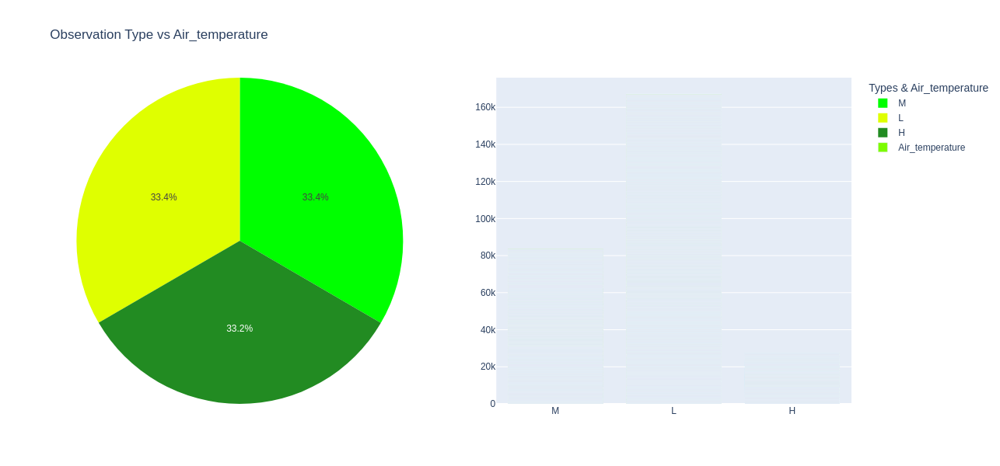

In [27]:
# Pie plot

color_palette = ['#00FF00', '#DFFF00', '#228B22', '#808000', '#2E8B57', '#008080']
Type = df.groupby("Type")["Air_temperature"].mean().sort_values(ascending=False)
type_index = Type.reset_index()
print("Rates of Air_temperature at every tupes :\n",Type)

fig = make_subplots(rows=1, cols=2, specs=[[{'type': 'pie'}, {'type': 'bar'}]])

# Add pie plot
fig.add_trace(go.Pie(labels=type_index['Type'], values=type_index['Air_temperature'], marker=dict(colors=color_palette)), row=1, col=1)

# Bar plot
fig.add_trace(go.Bar(name='Air_temperature', x=df["Type"], y=df["Air_temperature"], marker_color="#7CFC00"), row=1, col=2)

# Update layout
fig.update_layout(
    title="Observation Type vs Air_temperature",
    legend_title="Types & Air_temperature",
    width=1200,
    height=600,
    showlegend=True
)

# Show the plot
fig.show()


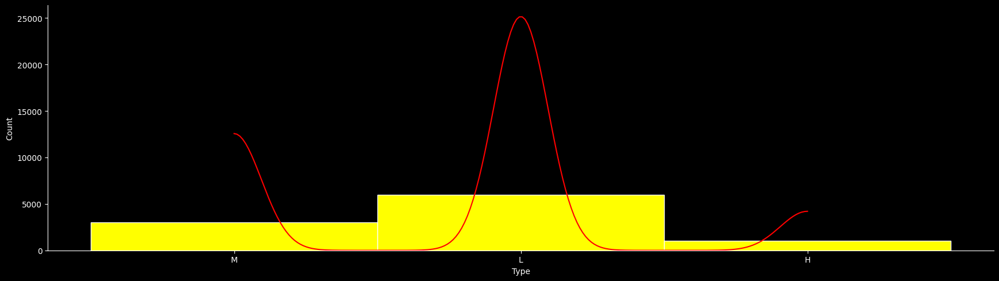

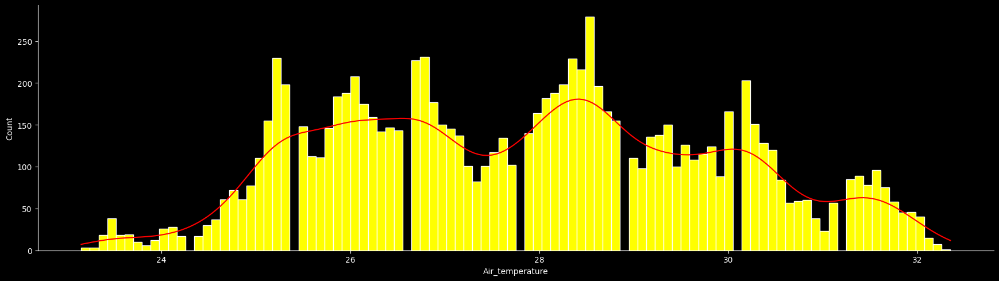

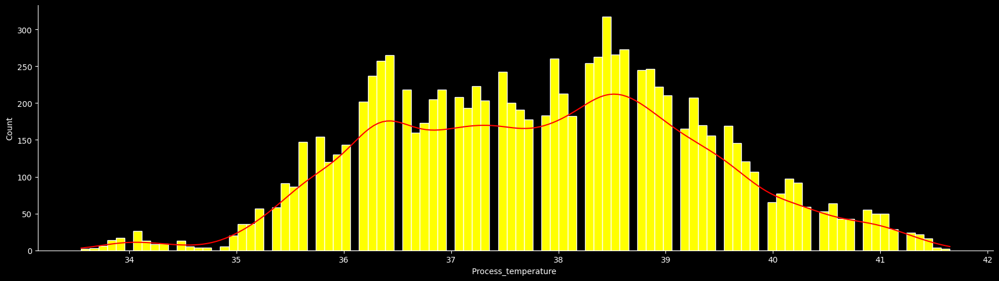

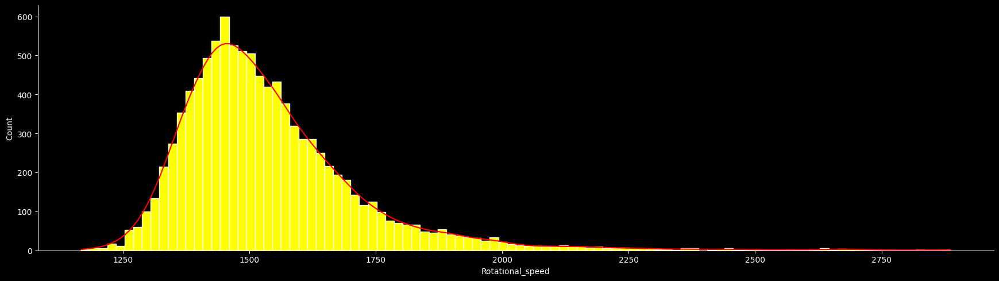

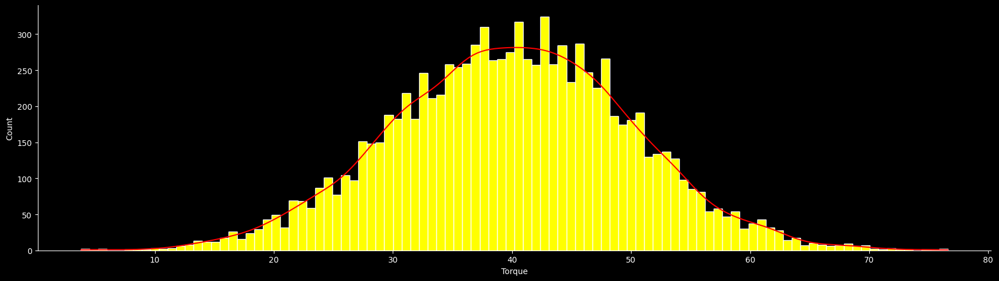

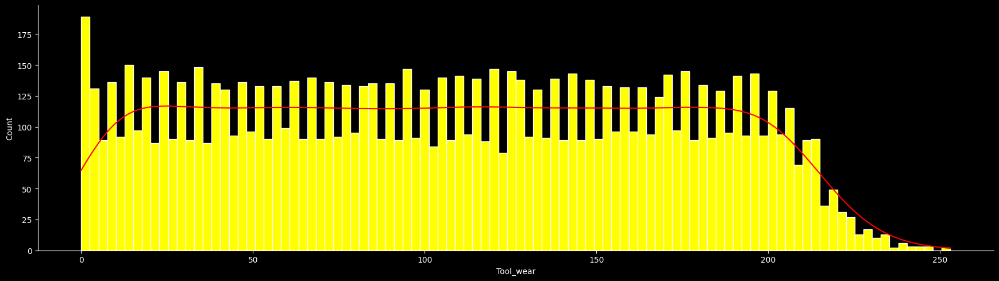

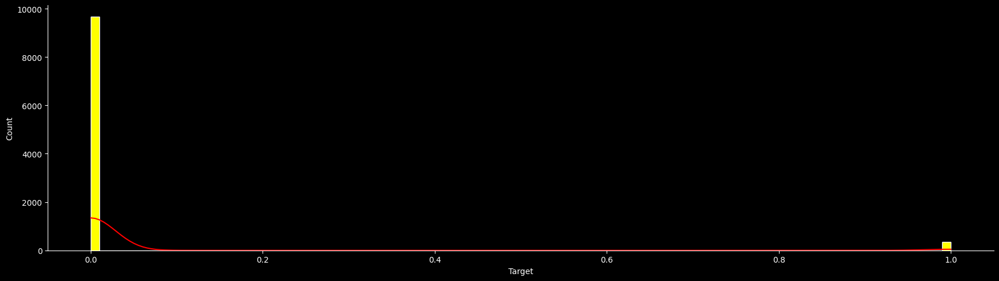

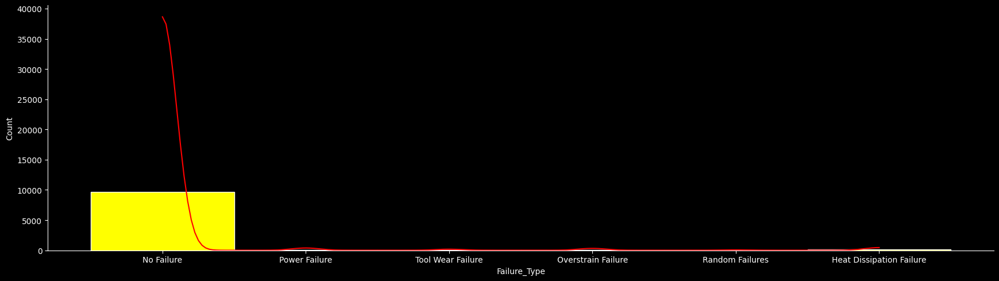

In [28]:
for col in df.columns:
    sns.displot(df, x=df[col], kde=True, bins = 100,color = "red", facecolor = "yellow",height = 5, aspect = 3.5);
    

In [29]:
df.select_dtypes("number").columns

Index(['Air_temperature', 'Process_temperature ', 'Rotational_speed', 'Torque',
       'Tool_wear', 'Target'],
      dtype='object')

No Relationship  :


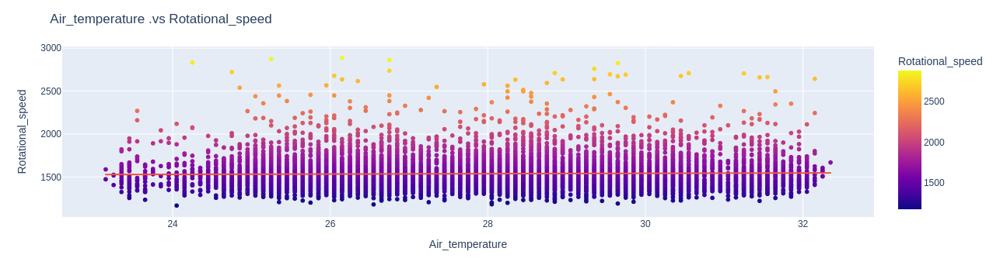

Negative Relationship :


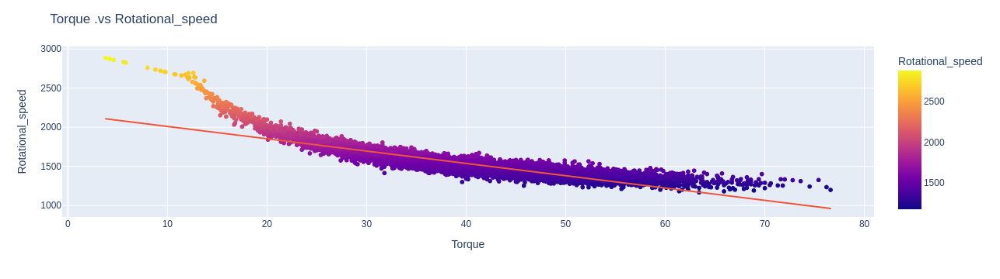

In [30]:
# Observation  between Type of Air_temperature  & Rotational_speed  :

print("No Relationship  :")
fig = px.scatter(df, x='Air_temperature', y='Rotational_speed', color='Rotational_speed', color_discrete_sequence=color_palette,trendline='ols')
fig.update_layout(title="Air_temperature .vs Rotational_speed ", xaxis_title="Air_temperature", yaxis_title="Rotational_speed")
fig.show()

#----------------------------------------------------------------------------

# Observation  between  of Torque  & Rotational_speed  :

print("Negative Relationship :")
fig = px.scatter(df, x='Torque', y='Rotational_speed', color='Rotational_speed', color_discrete_sequence=color_palette,trendline='ols')
fig.update_layout(title="Torque .vs Rotational_speed ", xaxis_title="Torque", yaxis_title="Rotational_speed")
fig.show()




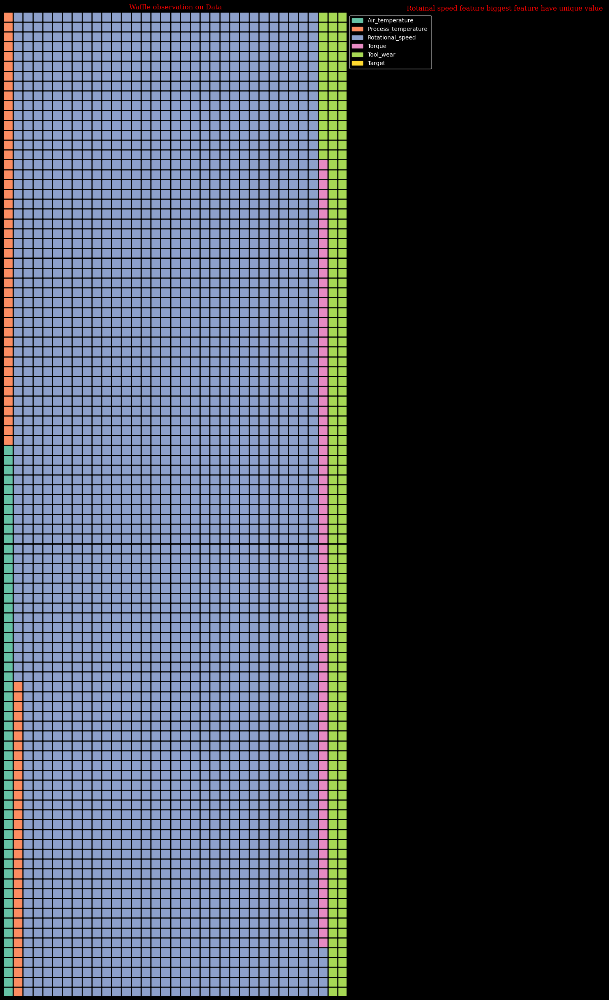

In [31]:
# Make a waffel for the Data:
# from this waffle i see which Feature is a controled on other features : 


f2 = {"family": "serif", "size": 12, "color": "r"}

from pywaffle import Waffle

numeric_columns = df.select_dtypes(include=['int64', 'float64']).columns
values = df[numeric_columns].sum().tolist()

fig = plt.figure(
    FigureClass=Waffle,
    rows=100,
    columns=35,
    values=values,
    legend={'labels': numeric_columns.tolist(),
            'loc': "upper left",
            'bbox_to_anchor': (1, 1)},
    figsize=(25, 25)
)
plt.title("Waffle observation on Data",fontdict=f2)
plt.suptitle("Rotainal speed feature biggest feature have unique value ",fontdict=f2)
plt.show()

In [32]:
df.columns

Index(['Type', 'Air_temperature', 'Process_temperature ', 'Rotational_speed',
       'Torque', 'Tool_wear', 'Target', 'Failure_Type'],
      dtype='object')

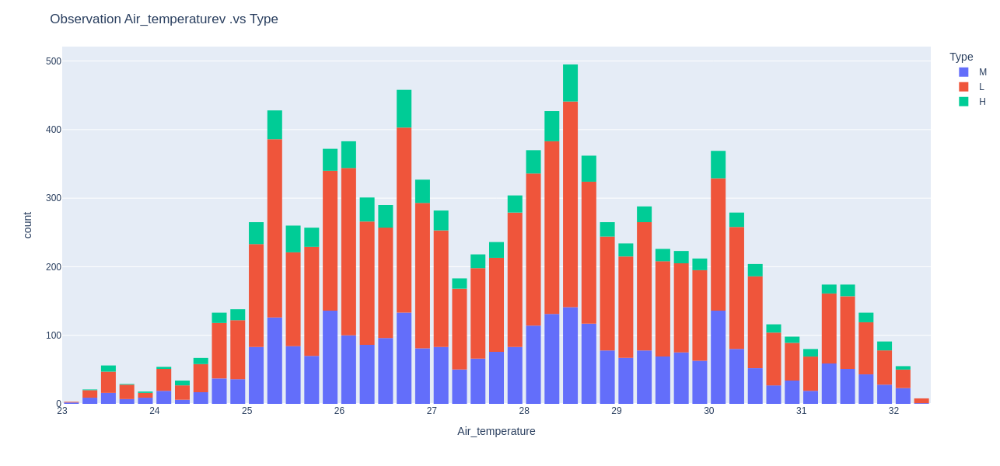

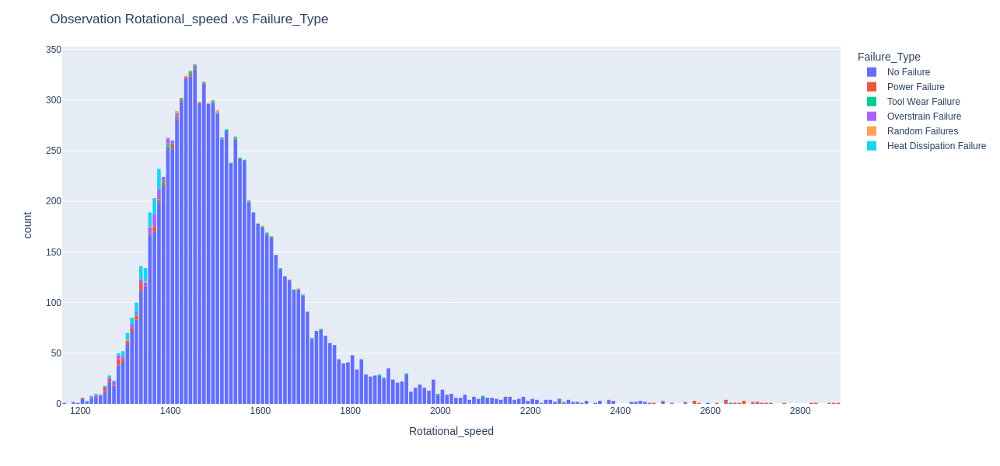

In [33]:
# Histogram that show how can see Air_temperature with Type  :
fig = px.histogram(df, x="Air_temperature", color="Type")
fig.update_layout(
    bargap=0.2,
    title="Observation Air_temperaturev .vs Type",
    legend_title="Type",
    width=800,  
    height=600  
)
fig.show()

#---------------------------------------------------------------------------

# Histogram that show how can see Rotational_speed with Rotational_speed  :

fig = px.histogram(df, x="Rotational_speed", color="Failure_Type")
fig.update_layout(
    bargap=0.2,
    title="Observation Rotational_speed .vs Failure_Type",
    legend_title="Failure_Type",
    width=800,  
    height=600  
)
fig.show()


In [34]:
df.columns

Index(['Type', 'Air_temperature', 'Process_temperature ', 'Rotational_speed',
       'Torque', 'Tool_wear', 'Target', 'Failure_Type'],
      dtype='object')

Rates of Torque at every type:
 Type
M    40.017251
L    39.996600
H    39.838285
Name: Torque, dtype: float64


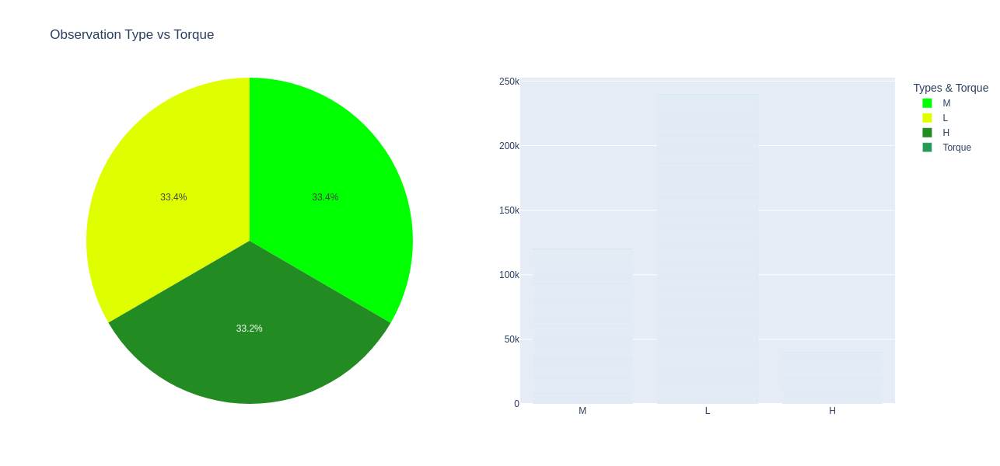

In [35]:
# Pie plot
color_palette = ['#00FF00', '#DFFF00', '#228B22', '#808000', '#2E8B57', '#008080']
Type = df.groupby("Type")["Torque"].mean().sort_values(ascending=False)
type_index = Type.reset_index()

print("Rates of Torque at every type:\n", Type)

fig = make_subplots(rows=1, cols=2, specs=[[{'type': 'pie'}, {'type': 'bar'}]])

# Add pie plot
fig.add_trace(go.Pie(labels=type_index['Type'], values=type_index['Torque'], marker=dict(colors=color_palette)), row=1, col=1)

# Bar plot
fig.add_trace(go.Bar(name='Torque', x=df["Type"], y=df["Torque"], marker_color="#239b56"), row=1, col=2)

# Update layout
fig.update_layout(
    title="Observation Type vs Torque",
    legend_title="Types & Torque",
    width=1200,
    height=600,
    showlegend=True
)

# Show the plot
fig.show()

array([[<Axes: title={'center': 'Air_temperature'}>,
        <Axes: title={'center': 'Process_temperature '}>],
       [<Axes: title={'center': 'Rotational_speed'}>,
        <Axes: title={'center': 'Torque'}>],
       [<Axes: title={'center': 'Tool_wear'}>,
        <Axes: title={'center': 'Target'}>]], dtype=object)

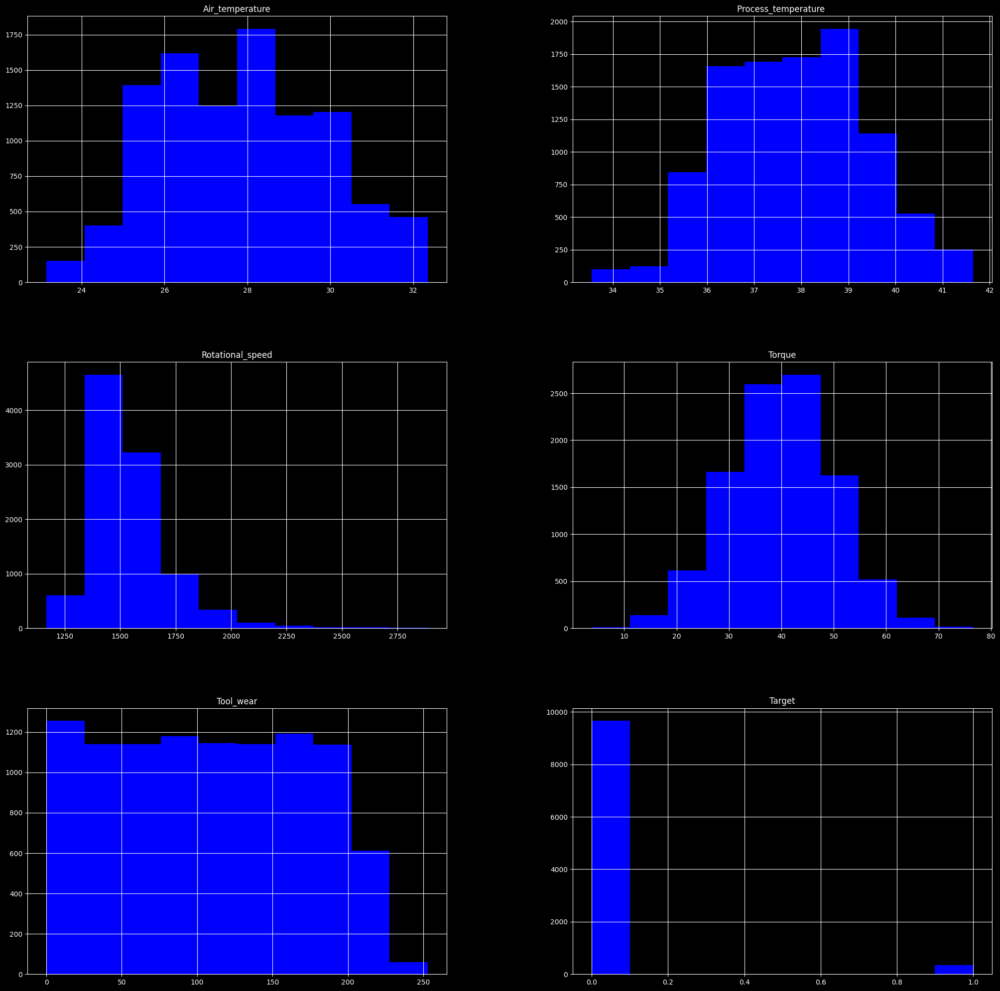

In [36]:
# plot the histgram:
df.hist(figsize=(25,25),color="b")

<Figure size 6250x6250 with 0 Axes>

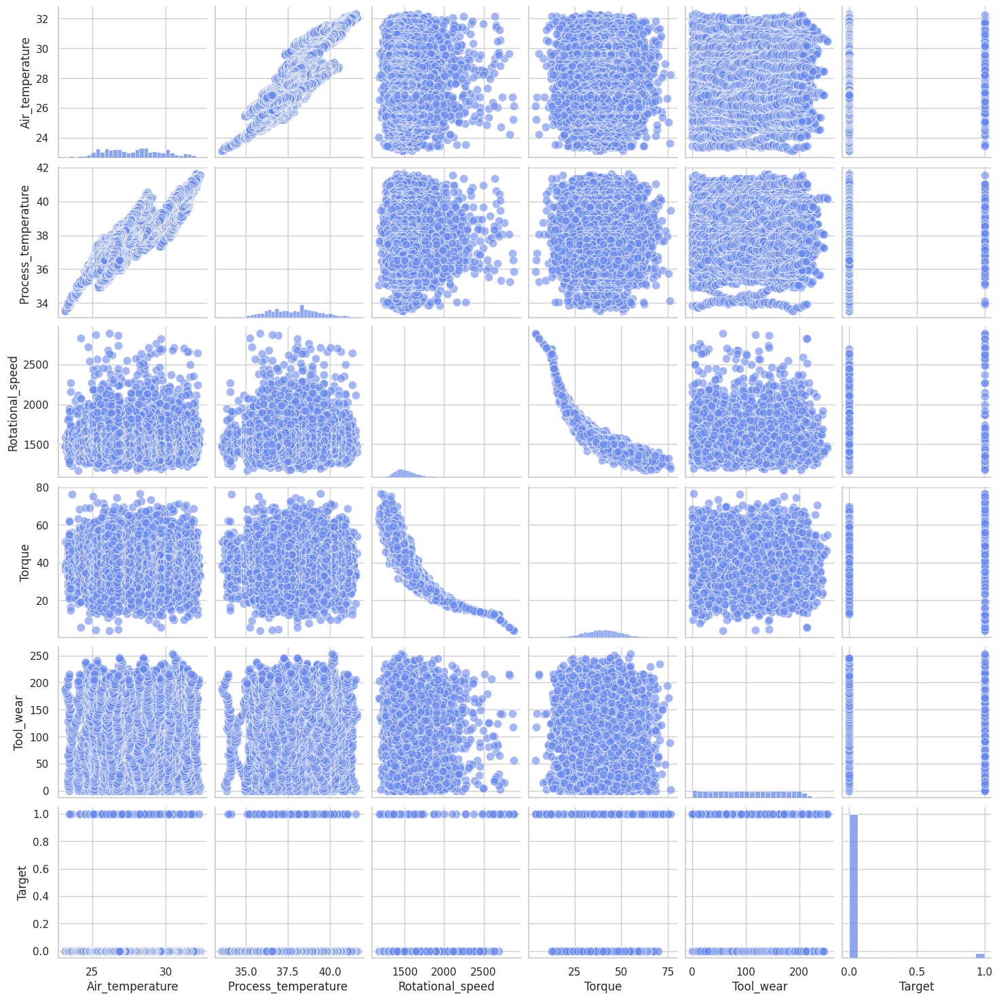

In [37]:
# observe for the float_data
plt.figure(figsize=(25, 25), dpi=250)
sns.set(style="whitegrid")  # Set the plot style
sns.set_palette("coolwarm")    # Set the color palette
sns.pairplot(df.select_dtypes("number"), plot_kws={'alpha': 0.6, 's': 80})

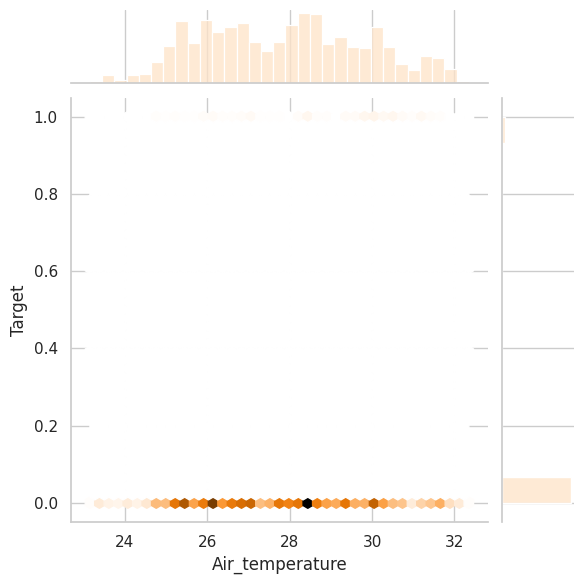

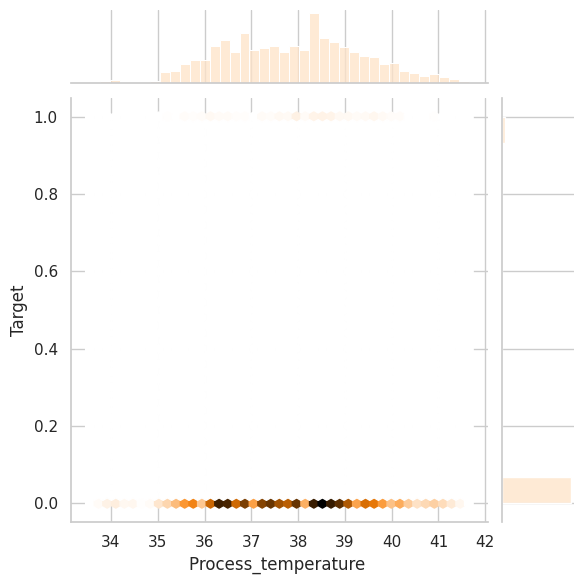

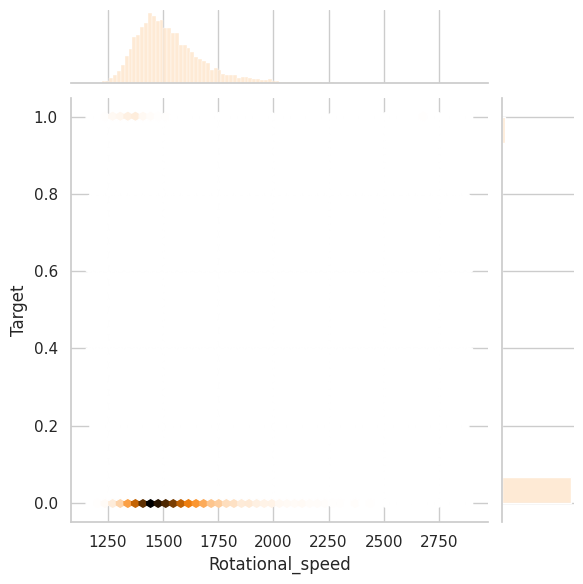

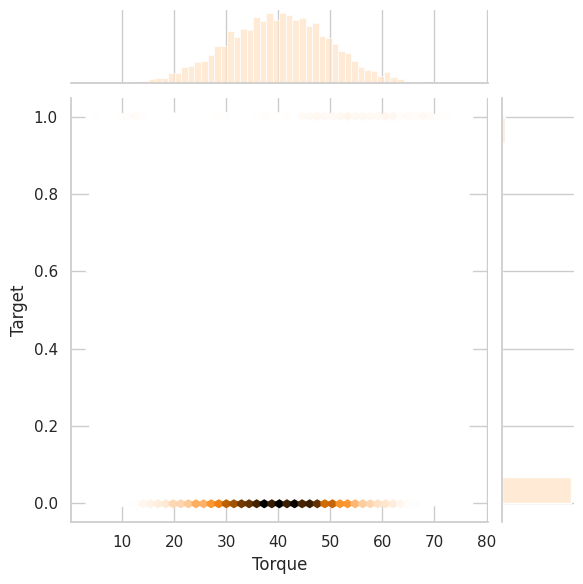

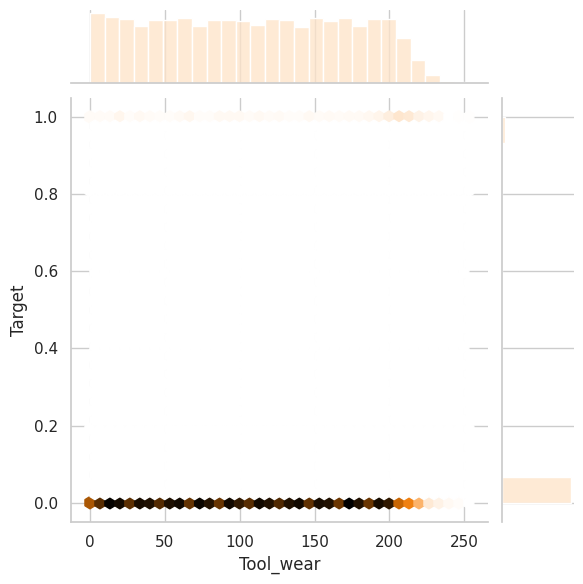

In [38]:
for col in df.select_dtypes("number"):
    if col !="Target":
       with sns.axes_style("white"):
          sns.set(style="whitegrid")  # Set the plot style
          sns.set_palette("Oranges")    # Set the color palette
          sns.jointplot(x=df[col],y=df["Target"],kind="hex")

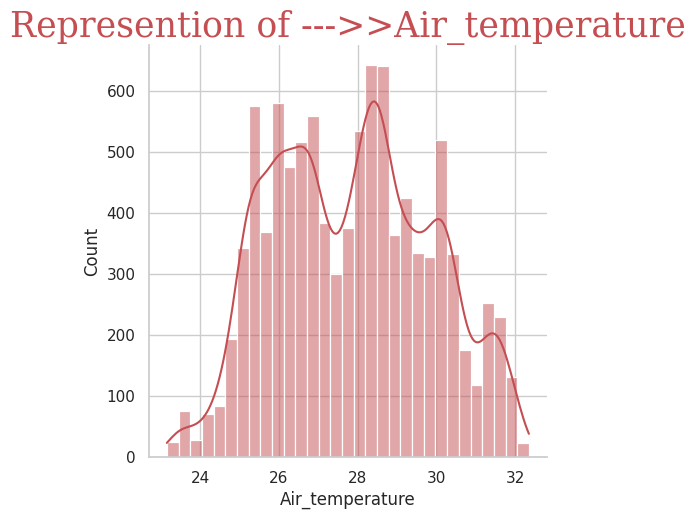

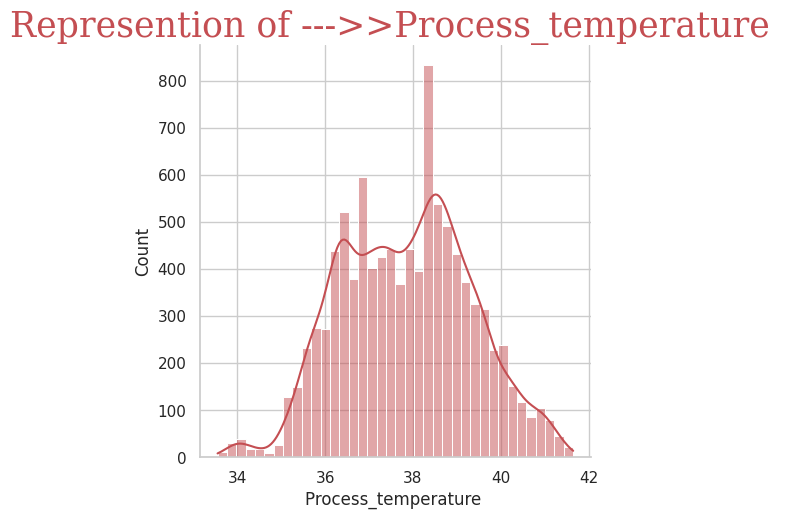

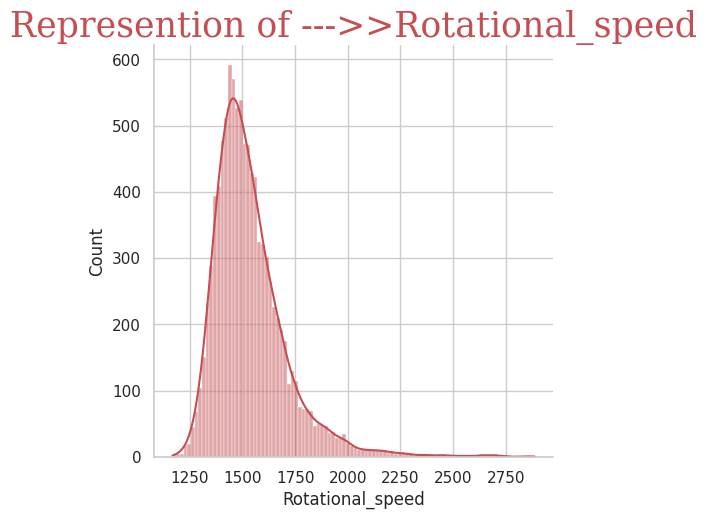

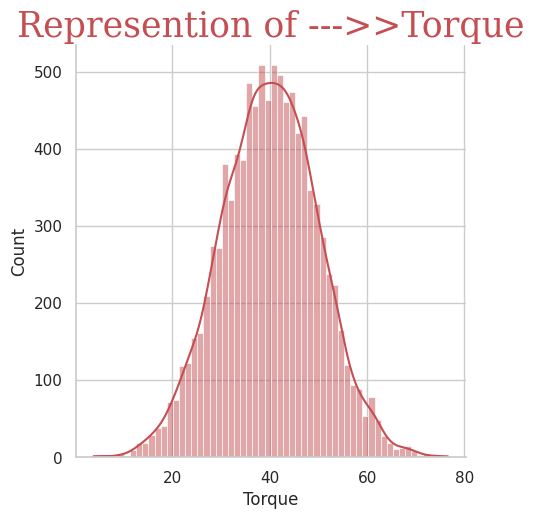

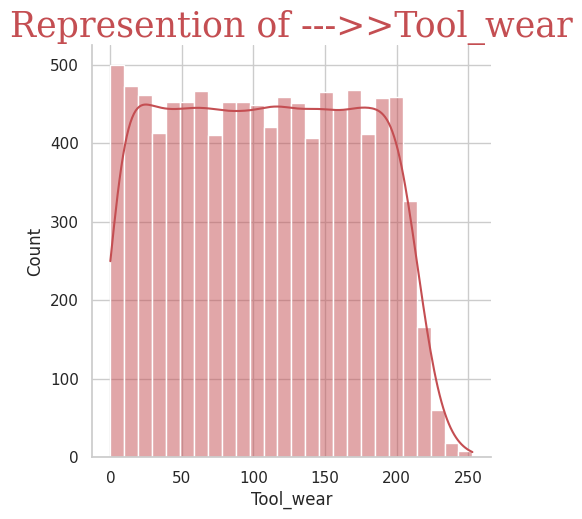

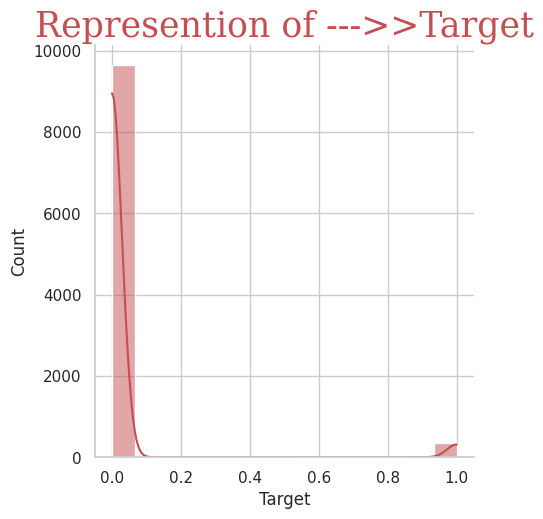

In [39]:
for col in df.select_dtypes("number").columns:
    sns.displot(df[col],kde=True,color="r",label=col)
    sns.set(style="whitegrid")  # Set the plot style
    sns.set_palette("coolwarm")    # Set the color palette
    plt.title("Represention of --->>"+col,fontdict=f1)

In [40]:
df.columns

Index(['Type', 'Air_temperature', 'Process_temperature ', 'Rotational_speed',
       'Torque', 'Tool_wear', 'Target', 'Failure_Type'],
      dtype='object')

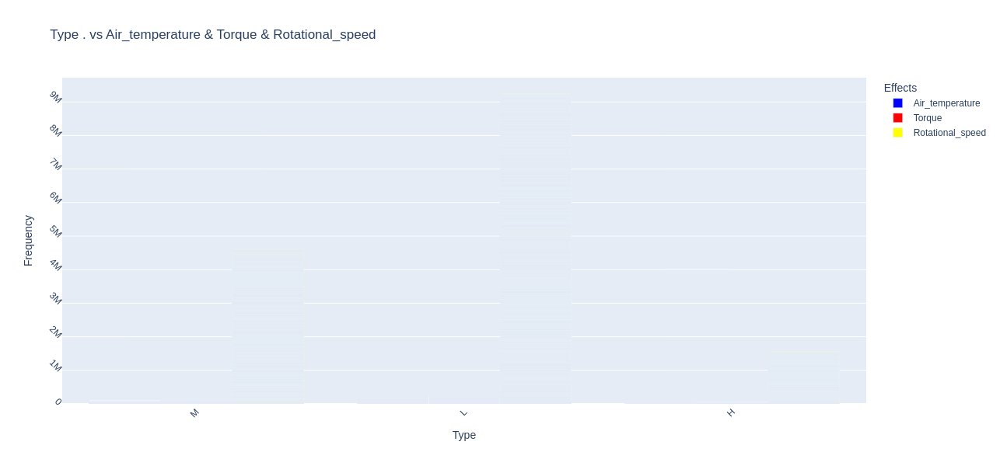

In [41]:
# whats the affect wheather on Type ?

x = df["Type"]
y1 =df["Air_temperature"]
y2 = df["Torque"]
y3=df["Rotational_speed"]

    
fig = go.Figure(data=[
        go.Bar(name='Air_temperature', x=x, y=y1,marker_color="blue"),
        go.Bar(name='Torque', x=x, y=y2,marker_color="red"),
        go.Bar(name='Rotational_speed',x=x,y=y3,marker_color="yellow")
    ])
    
fig.update_layout(barmode='group',
                      title='Type . vs Air_temperature & Torque & Rotational_speed ',
                      legend_title="Effects",
                      width=800,  
                      height=600 ,       
                      xaxis_title="Type",
                      yaxis_title="Frequency",
                      xaxis_tickangle=-45,
                      yaxis_tickangle=45
    ) 
    
fig.show()


## Important :







<div style="border: 5px solid yellow; padding: 10px; background-color: #F5F5F5; color: black; border-radius: 30px 45px 30px 45px;">

<p> &bull; we will get ride from Failure_Type </p> 

<p>&bull;There are two Targe:
Do not make the mistake of using one of them as feature, as it will lead to leakage.  </p>
</div>

In [42]:
df=df.drop("Failure_Type",axis=1)
df.columns

Index(['Type', 'Air_temperature', 'Process_temperature ', 'Rotational_speed',
       'Torque', 'Tool_wear', 'Target'],
      dtype='object')

## Feature Selection 

In [43]:
# convert Categorical into Numerical :
# Convert all Categorical columns into Numerical columns :

label_encoder=LabelEncoder()
for col in df.columns:
    df[col]=label_encoder.fit_transform(df[col])
df

,Type,Air_temperature,Process_temperature,Rotational_speed,Torque,Tool_wear,Target
0,2,28,29,325,313,0,0
1,1,29,30,182,348,2,0
2,1,28,28,272,379,4,0
3,1,29,29,207,280,6,0
4,1,29,30,182,285,8,0
...,...,...,...,...,...,...,...
9995,2,35,27,378,180,13,0
9996,0,36,27,406,203,16,0
9997,2,37,29,419,219,21,0
9998,0,37,30,182,370,24,0


In [44]:
# selecting numerical features :
numerical_features = df.select_dtypes(include=['number'])

scaler = MinMaxScaler()
scaled_numerical_features = scaler.fit_transform(numerical_features)

# Create a DataFrame from the scaled numerical features
scaled_numerical_df = pd.DataFrame(scaled_numerical_features, columns=numerical_features.columns)

scaled_numerical_df

,Type,Air_temperature,Process_temperature,Rotational_speed,Torque,Tool_wear,Target
0,1.0,0.304348,0.358025,0.345745,0.543403,0.000000,0.0
1,0.5,0.315217,0.370370,0.193617,0.604167,0.008163,0.0
2,0.5,0.304348,0.345679,0.289362,0.657986,0.016327,0.0
3,0.5,0.315217,0.358025,0.220213,0.486111,0.024490,0.0
4,0.5,0.315217,0.370370,0.193617,0.494792,0.032653,0.0
...,...,...,...,...,...,...,...
9995,1.0,0.380435,0.333333,0.402128,0.312500,0.053061,0.0
9996,0.0,0.391304,0.333333,0.431915,0.352431,0.065306,0.0
9997,1.0,0.402174,0.358025,0.445745,0.380208,0.085714,0.0
9998,0.0,0.402174,0.370370,0.193617,0.642361,0.097959,0.0


## Split Data for Classification :


<div style="border: 5px solid yellow; padding: 10px; background-color: #F5F5F5; color: black; border-radius: 30px 45px 30px 45px;">

<p> &bull; i split data into x_class & y_class </p> 

<p> &bull; x_class : refer into all Data Except Target (Failure or Not) </p> 

<p> &bull; y_class : refer into Target (Target)</p> 

<p> &bull; then , iused train_test_split method to divide data into test , train</p> 
</div>


In [45]:
# split the data int train & test :

x_class,y_clss=make_classification(n_samples=100,random_state=42)

x_class=scaled_numerical_df.drop(columns="Target",axis=1)
y_class=scaled_numerical_df["Target"]

In [46]:
### train split of the Data
x_train,x_test,y_train,y_test=train_test_split(x_class,y_class,test_size=0.3,random_state=42)
print("x_train shape : ",x_train.shape)
print("x_test shape : ",x_test.shape)
print("y_train shape : ",y_train.shape)
print("y_test shape : ",y_test.shape)

x_train shape :  (7000, 6)
x_test shape :  (3000, 6)
y_train shape :  (7000,)
y_test shape :  (3000,)


## Bulding Classification Models (Traditional_models) :

<div style="border: 2px solid yellow; padding: 10px; background-color: #F5F5F5; color: black; border-radius: 30px 45px 30px 45px;">



<p> &bull; <span class="label label-default" style="background-color:#DC1010; border-radius:12px; font-weight: bold; font-family:Verdana; font-size:28px; color:#FBFAFC; ">LogisticRegression 📊📈</span>  </p> 

<p> &bull; <span class="label label-default" style="background-color:#DC1010; border-radius:12px; font-weight: bold; font-family:Verdana; font-size:28px; color:#FBFAFC; ">Decision Tree Classifier 🎄</span>  </p> 

<p> &bull;<span class="label label-default" style="background-color:#DC1010; border-radius:12px; font-weight: bold; font-family:Verdana; font-size:28px; color:#FBFAFC; ">SVM 📚</span>  </p> 

<p> &bull; <span class="label label-default" style="background-color:#DC1010; border-radius:12px; font-weight: bold; font-family:Verdana; font-size:28px; color:#FBFAFC; ">Random Forest Classifier 🎄🎄🎄</span>  </p>

<p> &bull; <span class="label label-default" style="background-color:#DC1010; border-radius:12px; font-weight: bold; font-family:Verdana; font-size:28px; color:#FBFAFC; ">GradientBoostingClassifier 🌲🚀</span> </p>


</div>



In [47]:
## Define All Models that i will use it :

gridsearch1=GridSearchCV(estimator=RandomForestClassifier(),             # the model used
                        param_grid={"n_estimators":[50,100,160],         # Number of Decision Trees at each state
                        "max_depth":[50,120,180],                        # Number of maximum depth at each state
                        "max_features":[2,3,6]} ,                        # Number of features at naximum in your data
                         cv=3,
                         return_train_score=False,
                         scoring='f1')


gridsearch2=GridSearchCV(estimator=GradientBoostingClassifier(),
                        param_grid={"n_estimators":[50,100,120],
                        "max_depth":[50,120,200],
                        "max_features":[3,5,6]},
                         cv=3,
                         return_train_score=False,
                         scoring='f1')

models={
    "LogisticRegression":LogisticRegression(),
    "DecisionTreeClassifier":DecisionTreeClassifier(max_depth=5,max_features=6,random_state=42),
    "RandomForestClassifier":gridsearch1,
    "svm":svm.SVC(random_state=42,kernel='poly'),
    "GradientBoostingClassifier":gridsearch2}

<span class="label label-default" style="background-color:#DC1010; border-radius:12px; font-weight: bold; font-family:Verdana; font-size:28px; color:#FBFAFC; ">Bulding Models 📚📚📚📚📚</span>

Model: LogisticRegression
Mean Squared Error (MSE): 0.031
acc_train: 96.57%
acc_model: 96.90%
Mean Squared Error train data (MSE): 0.03428571428571429
Mean Squared Error test data (MSE): 0.031

Classification Report:
              precision    recall  f1-score   support

         0.0       0.97      1.00      0.98      2907
         1.0       0.00      0.00      0.00        93

    accuracy                           0.97      3000
   macro avg       0.48      0.50      0.49      3000
weighted avg       0.94      0.97      0.95      3000



Model: DecisionTreeClassifier
Mean Squared Error (MSE): 0.021
acc_train: 97.96%
acc_model: 97.90%
Mean Squared Error train data (MSE): 0.020428571428571428
Mean Squared Error test data (MSE): 0.021

Classification Report:
              precision    recall  f1-score   support

         0.0       0.98      1.00      0.99      2907
         1.0       0.78      0.45      0.57        93

    accuracy                           0.98      3000
   macro avg  

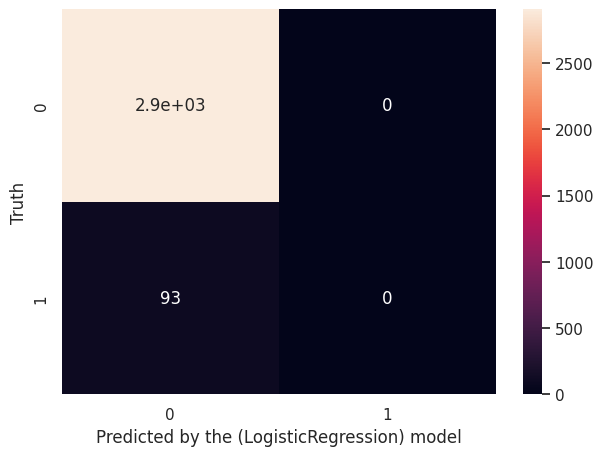

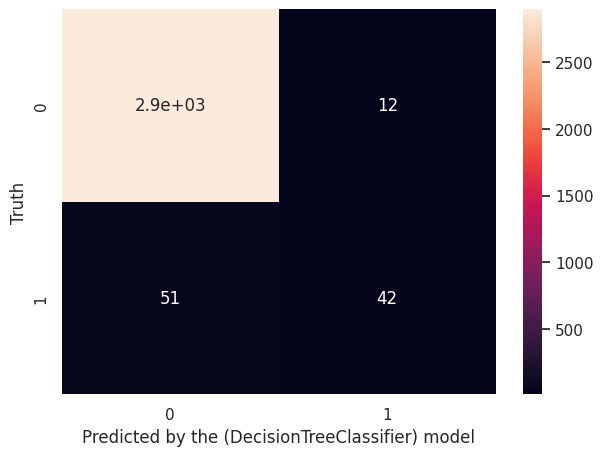

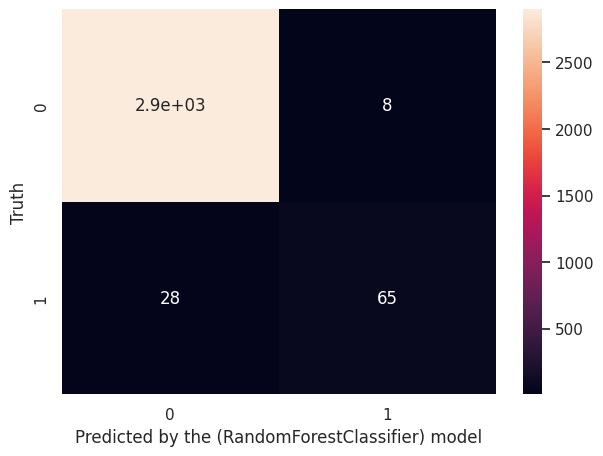

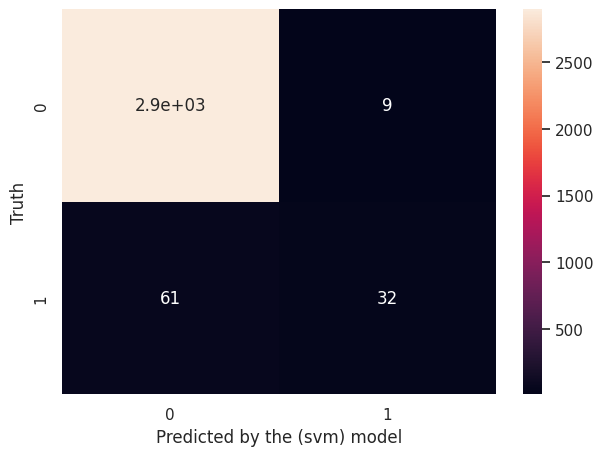

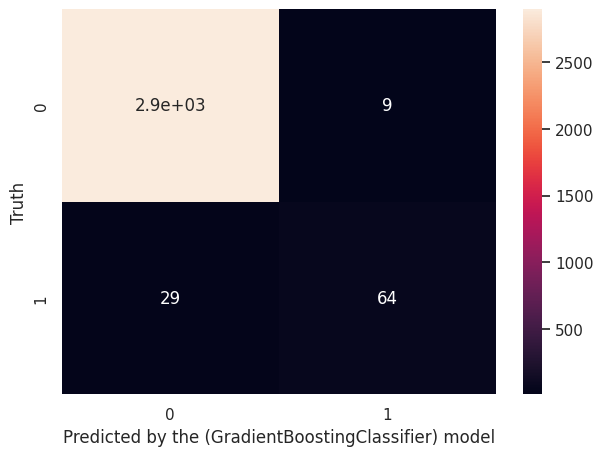

In [48]:
for model_name, model in models.items():
    # Fit the model to the training data
    model.fit(x_train, y_train)
    
    # Make predictions on the test & train data
    y_pred = model.predict(x_test)
    y_train_pred = model.predict(x_train)
    
    # calc acc Score on test & train data :
    acc_train = model.score(x_train, y_train)
    # calc mean square error on train & test data :
    
    mse_train = mean_squared_error(y_train, y_train_pred)
    mse_test = mean_squared_error(y_test, y_pred)
    
    
    # Evaluate the model
    mse = metrics.mean_squared_error(y_test, y_pred)
    acc = model.score(x_test,y_test)
    print("="*60)
    
    
    model_evaluation_metrics = {}
    # Calculate confusion matrix and classification report
    cm = confusion_matrix(y_test, y_pred)
    classif_report = classification_report(y_test, y_pred)
    # Storing the results
    model_evaluation_metrics[model_name] = {
        "Confusion Matrix":cm,
        'Classification Report': classif_report
    }
    
    plt.figure(figsize=(7,5))
    sns.heatmap(cm,annot=True)
    plt.xlabel(f"Predicted by the ({model_name}) model")
    plt.ylabel('Truth'),
    
    # Print the evaluation metrics for each model
    
    print(f"Model: {model_name}")
    print(f"Mean Squared Error (MSE): {mse}")
    
    print(f"acc_train: {acc_train*100:0.2f}%")
    print(f"acc_model: {acc*100:0.2f}%")
    
    print(f"Mean Squared Error train data (MSE): {mse_train}")
    print(f"Mean Squared Error test data (MSE): {mse_test}")
    print("\nClassification Report:")
    print(classif_report)
    print("\n" + "="*60 + "\n")
   
    

<p> &bull; <span class="label label-default" style="background-color:#DC1010; border-radius:12px; font-weight: bold; font-family:Verdana; font-size:28px; color:#FBFAFC; ">  Get feature importances for Decision Tree Classifier 🎄</span>  </p> 

In [49]:

font_properties = {
    'family': 'serif',
    'color': 'green',
    'weight': 'bold',
    'size': 45}

decision_tree_model = models["DecisionTreeClassifier"]
plt.figure(figsize=(95,85),dpi=150)  # Adjust figure size as needed
tree.plot_tree(decision_tree_model, filled=True, feature_names=x_class.columns, node_ids=True, fontsize=42)  # Control node size with fontsize
plt.title("Decision Tree",fontdict=font_properties)
plt.show()


In [50]:
feature_importances1 = decision_tree_model.feature_importances_
feature_names = x_class.columns

# Create a DataFrame to display feature importances
importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importances1})
importance_df = importance_df.sort_values(by='Importance', ascending=False)
importance_df.style.background_gradient(cmap="Blues")

,Feature,Importance
4,Torque,0.450426
1,Air_temperature,0.168187
3,Rotational_speed,0.138957
5,Tool_wear,0.122242
2,Process_temperature,0.116476
0,Type,0.003713


<p> &bull; <span class="label label-default" style="background-color:#DC1010; border-radius:12px; font-weight: bold; font-family:Verdana; font-size:28px; color:#FBFAFC; ">Random Forest Classifier 🎄🎄🎄</span>  </p>


In [51]:
best_estimator = gridsearch1.best_estimator_
feature_importances2 = best_estimator.feature_importances_
feature_names = x_class.columns

# Create a DataFrame to display feature importances

importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importances2})
importance_df = importance_df.sort_values(by='Importance', ascending=False)
importance_df.style.background_gradient(cmap="Oranges")

,Feature,Importance
4,Torque,0.336376
1,Air_temperature,0.191681
2,Process_temperature,0.157191
3,Rotational_speed,0.144044
5,Tool_wear,0.140371
0,Type,0.030336


<p> &bull; <span class="label label-default" style="background-color:#DC1010; border-radius:12px; font-weight: bold; font-family:Verdana; font-size:28px; color:#FBFAFC; ">GradientBoostingClassifier🌲🚀</span>  </p>

In [52]:
best_estimator = gridsearch2.best_estimator_
feature_importances3 = best_estimator.feature_importances_
feature_names = x_class.columns

# Create a DataFrame to display feature importances

importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importances3})
importance_df = importance_df.sort_values(by='Importance', ascending=False)
importance_df.style.background_gradient(cmap="Reds")

,Feature,Importance
4,Torque,0.285736
3,Rotational_speed,0.195392
1,Air_temperature,0.171184
2,Process_temperature,0.160161
5,Tool_wear,0.156049
0,Type,0.031477


<span class="label label-default" style="background-color:#DC1010; border-radius:12px; font-weight: bold; font-family:Verdana; font-size:28px; color:#FBFAFC;">Result 📚📚📚📚📚</span>

<div style="background-color:#34495e; color:#FBFAFC; padding:10px; border-radius:12px; margin-bottom:10px;">
  <p><strong>Model:</strong> GradientBoostingClassifier🌲🚀</p>
  <p><strong>Mean Squared Error (MSE):</strong> 0.011333333333333334</p>
  <p><strong>Model Accuracy:</strong> 80.23%</p>
</div>

<div style="background-color:#ecf0f1; color:#17202a; padding:10px; border-radius:12px; margin-bottom:10px;">
  <p><strong>Model:</strong> SVM 📚</p>
  <p><strong>Mean Squared Error (MSE):</strong> 0.023333333333333334</p>
  <p><strong>Model Accuracy:</strong> 97.67%</p>
</div>

<div style="background-color:#ecf0f1; color:#cb4335; padding:10px; border-radius:12px; margin-bottom:10px;">
  <p><strong>Model:</strong> RandomForestClassifier 🎄🎄🎄</p>
  <p><strong>Mean Squared Error (MSE):</strong> 0.013</p>
  <p><strong>Model Accuracy:</strong> 76.36%</p>
</div>

<div style="background-color:#ecf0f1; color:#3498db; padding:10px; border-radius:12px; margin-bottom:10px;">
  <p><strong>Model:</strong> DecisionTreeClassifier 🎄</p>
  <p><strong>Mean Squared Error (MSE):</strong> 0.021</p>
  <p><strong>Model Accuracy:</strong> 97.90%</p>
</div>

<div style="background-color:#ecf0f1; color:#d35400; padding:10px; border-radius:12px; margin-bottom:10px;">
  <p><strong>Model:</strong> LogisticRegression📊📈</p>
  <p><strong>Mean Squared Error (MSE):</strong> 0.031</p>
  <p><strong>Model Accuracy:</strong> 96.90%</p>
</div>

<span class="label label-default" style="background-color:#DC1010; border-radius:12px; font-weight: bold; font-family:Verdana; font-size:28px; color:#FBFAFC;">Saving & Load the best Model  📚📚📚📚📚</span>


In [53]:
import pickle 
with open('decision_tree_model.sav', 'wb') as file:
    pickle.dump(decision_tree_model, file)

with open('decision_tree_model.sav', 'rb') as file:
    my_object_loaded = pickle.load(file)

## Conclusion :














<div style="border: 5px solid green; padding: 10px; background-color: #F5F5F5; color: #4933ff; border-radius: 30px 45px 30px 45px;">


    
<p>&bull; in the Conclusion i want to thank all team of Neuro & Especially Eng\Taher .</p>
<p>&bull; thanks for all Neuro Team .</p>

<img src="https://images.pexels.com/photos/450597/pexels-photo-450597.jpeg?auto=compress&cs=tinysrgb&w=1260&h=750&dpr=1" alt="My Image">

<p>&bull; Your support is greatly appreciated! .</p>


<p>&bull; Kaggle: Your Home for Data Science</p>


<p>&bull; <a href="https://www.kaggle.com/abdalrhamnhebishy" target="_blank">Kaggle profile</a>.</p>


<p>&bull;  AbdalRhman Hebishy , DataScientist||Machine learning||Deeplearning Engineer .</p>
   

</div>

<img src="Neuro.jpg" alt="My Image">